# Fake News Detection

## Getting the data ready

In [47]:
#Bring out everything stored

%run Libraries.ipynb
%store -r 

#Create a second copy of the original dataframe in order to change its polarity column values with new ones and compare them

df3 = df2.copy()

df3

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Thanasis\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Thanasis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,id_str,text,created_at,polarity,user_location
314879,1425496491330842624,@Shawn_on_Games @nypost Do you not realize the...,2021-08-11 16:37:02,-1,"Orange Park, FL"
314880,1425496492685598725,Get ready!!! FAUCI warns FULL VACCINE MANDAT...,2021-08-11 16:37:02,1,"Michigan, USA"
314881,1425496493667098625,"it's one thing to get the vaccine voluntarily,...",2021-08-11 16:37:03,0,"Toronto, Ontario"
314882,1425496493830643716,@ScruffyVandal @Justasnowmexic1 @JiQed @Newswe...,2021-08-11 16:37:03,1,
314883,1425496494065528835,I can't believe we continue to fall into media...,2021-08-11 16:37:03,0,
...,...,...,...,...,...
364874,1425862484397854725,If you decide to get vaccinated against COVID ...,2021-08-12 16:51:22,0,"Lutz, FL"
364875,1425862486830501888,@DavidRF34 @archerbandrodie @realTuckFrumper H...,2021-08-12 16:51:22,0,Born in the USA
364876,1425862488277520384,Of course the media is silent. WellIn their de...,2021-08-12 16:51:23,0,
364877,1425862488285921289,@kayleighmcenany Florida radio host hospitaliz...,2021-08-12 16:51:23,0,


In [3]:
#Get only the text from our tweets and process it

mytweets_text = df3["text"].tolist()

myprocessed_tweets_text = []

for tweet in mytweets_text:

    processed_tweet = re.sub(r'\W', ' ', tweet)
 
    processed_tweet = re.sub(r'\s+[a-zA-Z]\s+', ' ', processed_tweet)
 
    processed_tweet = re.sub(r'\^[a-zA-Z]\s+', ' ', processed_tweet)
 
    processed_tweet = re.sub(r'\s+', ' ', processed_tweet, flags=re.I)
 
    processed_tweet = re.sub(r'^b\s+', '', processed_tweet)
 
    processed_tweet = processed_tweet.lower()
    
    myprocessed_tweets_text.append(processed_tweet)
    
myprocessed_tweets_text

[' shawn_on_games nypost do you not realize there is no covid 19 vaccine there is an experimental drug that contain https co 04tz4gsgzk',
 'get ready fauci warns full vaccine mandates coming pending fda full approval of the vaccines they are be https co ccf0zqqvlu',
 'it one thing to get the vaccine voluntarily it another thing to force people to get it it one thing to requ https co 3mp960pqcm',
 ' scruffyvandal justasnowmexic1 jiqed newsweek the intelligent people whove been paying attention know that this https co bvdyalq3hy',
 'i can believe we continue to fall into medias divisive tactics with this vaccine they used it in trump presid https co qnfzyhanug',
 ' jonjpreston coatsy79 helioschariot govuk gave you the only valid reason the vaccine does not prevent someone https co z4ovwedqak',
 ' the investigation into andrew cuomo revealed pattern of harassment back to school panic as states hold onto https co rtr5dj5yhl',
 ' theroot just typical conservative trumpster vaccine denier sm

In [4]:
#Getting the two datasets with true and fake news

true_data = pd.read_csv('true_news.csv')

fake_data = pd.read_csv('fake_news.csv')

news = pd.read_csv('news.csv')

true_data

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"
...,...,...,...,...
21412,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017"
21413,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017"
21414,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017"
21415,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017"


In [5]:
#Process the data from the datasets

def label_change(x):
    
    if (x == 0): return "true"
    if (x == 1):   return "fake"

news['label'] = news['label'].apply(label_change)   

true_data['label'] = ['true'] * len(true_data)
fake_data['label'] = ['fake'] * len(fake_data)

news2 = true_data.append(fake_data).sample(frac = 1).reset_index().drop(columns = ['index'])

In [6]:
#Get only the text and the label of the downloaded news from both datasets and put them in the same array

news_text = news["text"].values  
news_label = news["label"].values

news2_text = news2["text"].values  
news2_label = news2["label"].values

allnews_text = np.append(news_text, news2_text)
allnews_label =  np.append(news_label, news2_label)

In [7]:
#Create a pie chart to show the percentage of each label

df_pie_news = pd.DataFrame({'label':allnews_label})

df_pie_news = df_pie_news.groupby('label').size()

mylabels = ["Fake", "True"]
mycolors = ["darkred", "darkgreen"]
myvalues_true_fake = [df_pie_news["fake"], df_pie_news["true"]]

fig = go.Figure(data = [go.Pie(labels = mylabels, values = myvalues_true_fake)])
fig.update_traces(hoverinfo = 'label+percent', textinfo = 'value', textfont_size = 20, 
                  marker = dict(colors = mycolors, line = dict(color = '#000000', width = 2)),
                  title = "News Pie")

fig.show()

In [8]:
#Process the text of the downloaded news 

processed_news_text = []

for new in allnews_text:

    processed_news = re.sub(r'\W', ' ', str(new))
 
    processed_news = re.sub(r'\s+[a-zA-Z]\s+', ' ', processed_news)
 
    processed_news = re.sub(r'\^[a-zA-Z]\s+', ' ', processed_news)
 
    processed_news = re.sub(r'\s+', ' ', processed_news, flags=re.I)
 
    processed_news = re.sub(r'^b\s+', '', processed_news)
 
    processed_news = processed_news.lower()
    
    processed_news_text.append(processed_news)
    
processed_news_text

['house dem aide we didn even see comey letter until jason chaffetz tweeted it by darrell lucus on october 30 2016 subscribe jason chaffetz on the stump in american fork utah image courtesy michael jolley available under creative commons by license with apologies to keith olbermann there is no doubt who the worst person in the world is this week fbi director james comey but according to house democratic aide it looks like we also know who the second worst person is as well it turns out that when comey sent his now infamous letter announcing that the fbi was looking into emails that may be related to hillary clinton email server the ranking democrats on the relevant committees didn hear about it from comey they found out via tweet from one of the republican committee chairmen as we now know comey notified the republican chairmen and democratic ranking members of the house intelligence judiciary and oversight committees that his agency was reviewing emails it had recently discovered in o

## We use TF-IDF for text to numeric conversion

In [9]:
#Transform our and the downloaded processed texts

vectorizer = TfidfVectorizer(max_features = 2000, min_df = 10, max_df = 0.8, stop_words = stopwords.words('english'))

transformed_processed_news_text = vectorizer.fit_transform(processed_news_text).toarray()

transformed_myprocessed_tweets_text = vectorizer.fit_transform(myprocessed_tweets_text).toarray()

transformed_processed_news_text

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.10286156, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.04216447, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [10]:
#Split the data into the train and the test sets

X_train, X_test, y_train, y_test = train_test_split(transformed_processed_news_text, allnews_label, test_size = 0.2, random_state = 0)

## Classification prediction models

In [10]:
#Make a list to put all the algorithm accuracies in order to compare them in the end

accuracy = []
algorithms = ['Logistic Regression', 'Naive-Bayes Classifier', 'Decision Tree Classifier', 'Random Forest Classifier', 'Support Vector Machine Classifier', 'K-Nearest Neighbours Classifier', 'Stochastic Gradient Descent Classifier', 'Gradient Boosting Classifier', 'XGBoost Classifier', 'Passive Aggressive Classifier', 'LSTM Classifier']

### Logistic Regression

In [11]:
#Build the lor model and make the predictions

model_lor = LogisticRegression(solver = "sag").fit(X_train, y_train)

predictions = model_lor.predict(X_test)

df_lor = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_lor

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,fake,fake
4,true,true
...,...,...
13135,true,true
13136,true,true
13137,true,true
13138,fake,fake


In [92]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[6470  280]
 [ 356 6034]]
              precision    recall  f1-score   support

        fake       0.95      0.96      0.95      6750
        true       0.96      0.94      0.95      6390

    accuracy                           0.95     13140
   macro avg       0.95      0.95      0.95     13140
weighted avg       0.95      0.95      0.95     13140

0.9515981735159817


### Naive-Bayes Classifier

In [93]:
#Build the nbc model and make the predictions

model_nbc = MultinomialNB().fit(X_train, y_train)

predictions = model_nbc.predict(X_test)

df_nbc = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_nbc

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,true,true
4,fake,true
...,...,...
13135,true,fake
13136,true,true
13137,fake,fake
13138,fake,fake


In [94]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[5931  819]
 [1061 5329]]
              precision    recall  f1-score   support

        fake       0.85      0.88      0.86      6750
        true       0.87      0.83      0.85      6390

    accuracy                           0.86     13140
   macro avg       0.86      0.86      0.86     13140
weighted avg       0.86      0.86      0.86     13140

0.8569254185692542


### Decision Tree Classifier

In [95]:
#Build the dtc model and make the predictions

model_dtc = DecisionTreeClassifier(random_state = 0).fit(X_train,y_train)

predictions = model_dtc.predict(X_test)

df_dtc = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_dtc

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,true,true
4,fake,fake
...,...,...
13135,true,true
13136,true,true
13137,fake,fake
13138,fake,fake


In [96]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[6385  365]
 [ 470 5920]]
              precision    recall  f1-score   support

        fake       0.93      0.95      0.94      6750
        true       0.94      0.93      0.93      6390

    accuracy                           0.94     13140
   macro avg       0.94      0.94      0.94     13140
weighted avg       0.94      0.94      0.94     13140

0.9364535768645358


### Random Forest Classifier

In [97]:
#Build the rfc model and make the predictions

model_rfc = RandomForestClassifier(n_estimators = 100, random_state = 0).fit(X_train, y_train)

predictions = model_rfc.predict(X_test)

df_rfc = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_rfc

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,true,true
4,fake,fake
...,...,...
13135,true,true
13136,true,true
13137,fake,fake
13138,fake,fake


In [98]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[6587  163]
 [ 417 5973]]
              precision    recall  f1-score   support

        fake       0.94      0.98      0.96      6750
        true       0.97      0.93      0.95      6390

    accuracy                           0.96     13140
   macro avg       0.96      0.96      0.96     13140
weighted avg       0.96      0.96      0.96     13140

0.9558599695585996


### Support Vector Machine Classifier

In [99]:
#Build the svmc model and make the predictions

model_svmc = svm.SVC(kernel = 'linear').fit(X_train, y_train)

predictions = model_svmc.predict(X_test)

df_svmc = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_svmc

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,true,true
4,fake,fake
...,...,...
13135,true,true
13136,true,true
13137,fake,fake
13138,fake,fake


In [100]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[6517  233]
 [ 310 6080]]
              precision    recall  f1-score   support

        fake       0.95      0.97      0.96      6750
        true       0.96      0.95      0.96      6390

    accuracy                           0.96     13140
   macro avg       0.96      0.96      0.96     13140
weighted avg       0.96      0.96      0.96     13140

0.958675799086758


### K-Nearest Neighbours Classifier

In [101]:
#Build the knnc model and make the predictions

model_knnc = KNeighborsClassifier(n_neighbors = 7).fit(X_train, y_train)

predictions = model_knnc.predict(X_test) 

df_knnc = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_knnc

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,true,fake
4,fake,true
...,...,...
13135,true,fake
13136,true,fake
13137,fake,true
13138,fake,true


In [102]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[6428  322]
 [3634 2756]]
              precision    recall  f1-score   support

        fake       0.64      0.95      0.76      6750
        true       0.90      0.43      0.58      6390

    accuracy                           0.70     13140
   macro avg       0.77      0.69      0.67     13140
weighted avg       0.76      0.70      0.68     13140

0.6989345509893455


### Stochastic Gradient Descent Classifier

In [103]:
#Build the sgdc model and make the predictions

model_sgdc = SGDClassifier(loss = 'modified_huber', shuffle = True, random_state = 0).fit(X_train, y_train)

predictions = model_sgdc.predict(X_test) 

df_sgdc = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_sgdc

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,true,true
4,fake,fake
...,...,...
13135,true,true
13136,true,true
13137,fake,fake
13138,fake,fake


In [104]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[6447  303]
 [ 273 6117]]
              precision    recall  f1-score   support

        fake       0.96      0.96      0.96      6750
        true       0.95      0.96      0.96      6390

    accuracy                           0.96     13140
   macro avg       0.96      0.96      0.96     13140
weighted avg       0.96      0.96      0.96     13140

0.9561643835616438


### Gradient Boosting Classifier

In [105]:
#Build the gbc model and make the predictions

model_gbc = GradientBoostingClassifier(n_estimators = 100, learning_rate = 0.5, max_features = 2, max_depth = 2, random_state = 0).fit(X_train, y_train)

predictions = model_gbc.predict(X_test) 

df_gbc = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_gbc

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,true,true
4,fake,fake
...,...,...
13135,true,true
13136,true,true
13137,fake,fake
13138,fake,fake


In [106]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[5731 1019]
 [1299 5091]]
              precision    recall  f1-score   support

        fake       0.82      0.85      0.83      6750
        true       0.83      0.80      0.81      6390

    accuracy                           0.82     13140
   macro avg       0.82      0.82      0.82     13140
weighted avg       0.82      0.82      0.82     13140

0.8235920852359209


### XGBoost Classifier

In [67]:
#Build the xgbc model and make the predictions

model_xgbc = XGBClassifier().fit(X_train, y_train)

predictions = model_xgbc.predict(X_test) 

df_xgbc = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_xgbc

C:\Users\Thanasis\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[09:44:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,true,true
4,fake,fake
...,...,...
13135,true,true
13136,true,true
13137,true,true
13138,fake,fake


In [68]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[6685  117]
 [ 227 6111]]
              precision    recall  f1-score   support

        fake       0.97      0.98      0.97      6802
        true       0.98      0.96      0.97      6338

    accuracy                           0.97     13140
   macro avg       0.97      0.97      0.97     13140
weighted avg       0.97      0.97      0.97     13140

0.973820395738204


### Passive Aggressive Classifier

In [37]:
#Build the pac model and make the predictions

model_pac = PassiveAggressiveClassifier(max_iter = 50).fit(X_train, y_train)

predictions = model_pac.predict(X_test)

df_pac = pd.DataFrame({'Actual':y_test, 'Predicted':predictions})

df_pac

,Actual,Predicted
0,fake,fake
1,true,true
2,true,true
3,fake,fake
4,true,true
...,...,...
13135,true,true
13136,true,true
13137,true,true
13138,fake,fake


In [110]:
#Print metrics

print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))
print(accuracy_score(y_test, predictions))

accuracy.append(round(accuracy_score(y_test, predictions), 4))

[[6203  547]
 [ 173 6217]]
              precision    recall  f1-score   support

        fake       0.97      0.92      0.95      6750
        true       0.92      0.97      0.95      6390

    accuracy                           0.95     13140
   macro avg       0.95      0.95      0.95     13140
weighted avg       0.95      0.95      0.95     13140

0.9452054794520548


### Neural Networks - LSTM Classifier

#### Tokenizer Setup

In [54]:
#Setting up the tokenizer

# The maximum number of words to be used (most frequent)

MAX_NB_WORDS = 100000

# Max number of words each time

MAX_SEQUENCE_LENGTH = 250

EMBEDDING_DIM = 100

tokenizer = Tokenizer(num_words = MAX_NB_WORDS, filters = '!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower = True)
tokenizer.fit_on_texts(processed_news_text)
word_index = tokenizer.word_index

In [55]:
#Transforming all the data

X = tokenizer.texts_to_sequences(processed_news_text)
X = pad_sequences(X, maxlen = MAX_SEQUENCE_LENGTH)

myseq = tokenizer.texts_to_sequences(myprocessed_tweets_text)
mypadded = pad_sequences(myseq, maxlen = MAX_SEQUENCE_LENGTH)

print('Shape of data tensor:', X.shape)

y = pd.get_dummies(allnews_label).values

print('Shape of label tensor:', y.shape)

X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size = 0.2, random_state = 0)

Shape of data tensor: (65698, 250)
Shape of label tensor: (65698, 2)


#### LSTM

In [56]:
#Setting up the LSTM model

model_lstm = Sequential()
model_lstm.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length = X.shape[1]))
model_lstm.add(SpatialDropout1D(0.2))
model_lstm.add(LSTM(100, dropout = 0.2, recurrent_dropout = 0.2))
model_lstm.add(Dense(2, activation = 'softmax'))

model_lstm.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

model_lstm.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 250, 100)          10000000  
_________________________________________________________________
spatial_dropout1d_5 (Spatial (None, 250, 100)          0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 202       
Total params: 10,080,602
Trainable params: 10,080,602
Non-trainable params: 0
_________________________________________________________________


In [57]:
#Training the model

myepochs = 5
mybatch_size = 64

history = model_lstm.fit(X_train2, y_train2, epochs = myepochs, batch_size = mybatch_size, validation_split = 0.1,
                         callbacks = [EarlyStopping(monitor = 'val_loss', patience = 3, min_delta = 0.0001)])

Epoch 1/5
740/740 [==============================] - 1701s 2s/step - loss: 0.1956 - accuracy: 0.9240 - val_loss: 0.1360 - val_accuracy: 0.9488
Epoch 2/5
740/740 [==============================] - 1574s 2s/step - loss: 0.0925 - accuracy: 0.9681 - val_loss: 0.1228 - val_accuracy: 0.9625
Epoch 3/5
740/740 [==============================] - 1561s 2s/step - loss: 0.0445 - accuracy: 0.9856 - val_loss: 0.1307 - val_accuracy: 0.9625
Epoch 4/5
740/740 [==============================] - 1532s 2s/step - loss: 0.0257 - accuracy: 0.9917 - val_loss: 0.2127 - val_accuracy: 0.9247
Epoch 5/5
740/740 [==============================] - 1517s 2s/step - loss: 0.0181 - accuracy: 0.9942 - val_loss: 0.2137 - val_accuracy: 0.9591


In [58]:
#Print metrics

accr = model_lstm.evaluate(X_test2, y_test2)

print('Test set:\n  Loss: {:0.4f}\n  Accuracy: {:0.4f}'.format(accr[0], accr[1]))

accuracy.append(round(accr[1], 4))

411/411 [==============================] - 74s 172ms/step - loss: 0.1803 - accuracy: 0.9625
Test set:
  Loss: 0.1803
  Accuracy: 0.9625


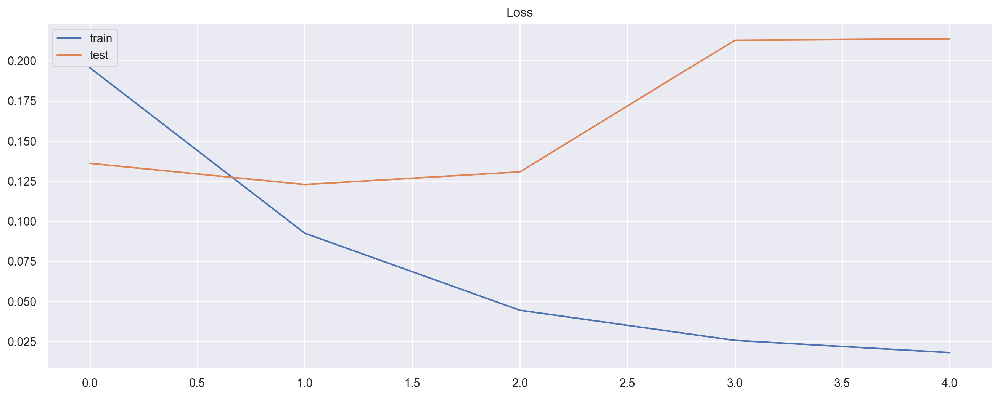

In [59]:
#Plot the Loss

mpl.rcParams['figure.dpi'] = 200
plt.figure(figsize = (16, 6))
sns.set(style = "darkgrid")

plt.title('Loss')
plt.plot(history.history['loss'], label = 'train')
plt.plot(history.history['val_loss'], label = 'test')
plt.legend()

plt.show();

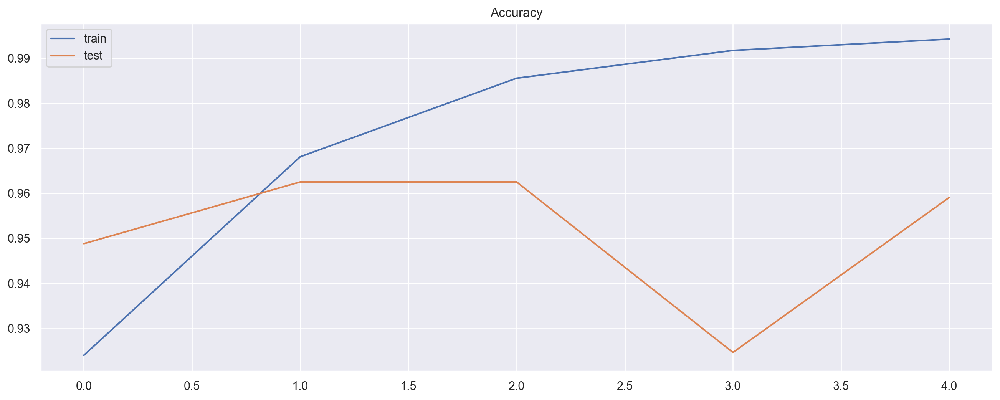

In [60]:
#Plot the accuracy

mpl.rcParams['figure.dpi'] = 200
plt.figure(figsize = (16, 6))
sns.set(style = "darkgrid")

plt.title('Accuracy')
plt.plot(history.history['accuracy'], label = 'train')
plt.plot(history.history['val_accuracy'], label = 'test')
plt.legend()

plt.show();

## Results

In [64]:
df_accuracy = pd.DataFrame({'Algorithm': algorithms, 'Accuracy': np.array(accuracy) * 100})

df_accuracy

,Algorithm,Accuracy
0,Logistic Regression,95.16
1,Naive-Bayes Classifier,85.69
2,Decision Tree Classifier,93.65
3,Random Forest Classifier,95.59
4,Support Vector Machine Classifier,95.87
5,K-Nearest Neighbours Classifier,69.89
6,Stochastic Gradient Descent Classifier,95.62
7,Gradient Boosting Classifier,82.36
8,XGBoost Classifier,97.37
9,Passive Aggressive Classifier,94.52


In [65]:
#Plot the accuracy of each algorithm

fig = px.bar(df_accuracy, x = "Algorithm", y = "Accuracy", title = "Algorithm Accuracy")
fig.update_traces(marker_color = 'rgb(0,139,139)', marker_line_color = 'rgb(0,0,0)', marker_line_width = 2)

fig.show()

## Best algorithm selection

In [39]:
while(1):

    print("Here are all the algorithms: Logistic Regression, Naive-Bayes Classifier, Decision Tree Classifier, Random Forest Classifier, Support Vector Machine Classifier, K-Nearest Neighbours Classifier, Stochastic Gradient Descent Classifier, Gradient Boosting Classifier, XGBoost Classifier, Passive Aggressive Classifier, LSTM Classifier\n")
    
    time.sleep(1)
    
    answer_algorithm = input("Please select the algorithm you want to use to predict the polarity of our tweets. Your answer: ")
    
    if(answer_algorithm != "Logistic Regression" and answer_algorithm != "Naive-Bayes Classifier" 
       and answer_algorithm != "Decision Tree Classifier" and answer_algorithm != "Random Forest Classifier" 
       and answer_algorithm != "Support Vector Machine Classifier" and answer_algorithm != "K-Nearest Neighbours Classifier" 
       and answer_algorithm != "Stochastic Gradient Descent Classifier" and answer_algorithm != "Gradient Boosting Classifier" 
       and answer_algorithm != "XGBoost Classifier" and answer_algorithm != "LSTM Classifier"
       and answer_algorithm != "Passive Aggressive Classifier"):
        
        print("\nThere was an error with your algorithm selection. Please try again.\n")
    
    else:
        
        break
    
if(answer_algorithm == "Logistic Regression"):
    
    model_to_use = model_lor
    text = transformed_myprocessed_tweets_text
    
elif(answer_algorithm == "Naive-Bayes Classifier"):
    
    model_to_use = model_nbc
    text = transformed_myprocessed_tweets_text

elif(answer_algorithm == "Decision Tree Classifier"):
    
    model_to_use = model_dtc
    text = transformed_myprocessed_tweets_text
    
elif(answer_algorithm == "Random Forest Classifier"):
    
    model_to_use = model_rfc
    text = transformed_myprocessed_tweets_text
    
elif(answer_algorithm == "Support Vector Machine Classifier"):
    
    model_to_use = model_svmc
    text = transformed_myprocessed_tweets_text
    
elif(answer_algorithm == "K-Nearest Neighbours Classifier"):
    
    model_to_use = model_knnc
    text = transformed_myprocessed_tweets_text
    
elif(answer_algorithm == "Stochastic Gradient Descent Classifier"):
    
    model_to_use = model_sgdc
    text = transformed_myprocessed_tweets_text
    
elif(answer_algorithm == "Gradient Boosting Classifier"):
    
    model_to_use = model_gbc
    text = transformed_myprocessed_tweets_text
    
elif(answer_algorithm == "XGBoost Classifier"):
    
    model_to_use = model_xgbc
    text = transformed_myprocessed_tweets_text

elif(answer_algorithm == "Passive Aggressive Classifier"):
    
    model_to_use = model_pac
    text = transformed_myprocessed_tweets_text
    
else:
    
    model_to_use = model_lstm
    text = mypadded

Here are all the algorithms: Logistic Regression, Naive-Bayes Classifier, Decision Tree Classifier, Random Forest Classifier, Support Vector Machine Classifier, K-Nearest Neighbours Classifier, Stochastic Gradient Descent Classifier, Gradient Boosting Classifier, XGBoost Classifier, Passive Aggressive Classifier, LSTM Classifier

Please select the algorithm you want to use to predict the polarity of our tweets. Your answer: Passive Aggressive Classifier


In [40]:
#We predict the label of our own tweets

predictions = model_to_use.predict(text)

if(model_to_use == model_lstm):
    
    mypredictions = []

    for i in range(0, len(predictions)):
        
        if(predictions[i][0] == np.max(predictions[i])):
            
            mypredictions.append("fake")
        
        else:
            
            mypredictions.append("true") 
        
    mypredictions = pd.DataFrame(mypredictions, columns = ['label'])
    
else:
    
    mypredictions = pd.DataFrame(predictions, columns = ['label'])

mypredictions

,label
0,fake
1,fake
2,fake
3,fake
4,fake
...,...
49995,fake
49996,fake
49997,fake
49998,fake


In [48]:
#Insert the labels in df3

df3["label"] = mypredictions["label"].values

df3

,id_str,text,created_at,polarity,user_location,label
314879,1425496491330842624,@Shawn_on_Games @nypost Do you not realize the...,2021-08-11 16:37:02,-1,"Orange Park, FL",fake
314880,1425496492685598725,Get ready!!! FAUCI warns FULL VACCINE MANDAT...,2021-08-11 16:37:02,1,"Michigan, USA",fake
314881,1425496493667098625,"it's one thing to get the vaccine voluntarily,...",2021-08-11 16:37:03,0,"Toronto, Ontario",fake
314882,1425496493830643716,@ScruffyVandal @Justasnowmexic1 @JiQed @Newswe...,2021-08-11 16:37:03,1,,fake
314883,1425496494065528835,I can't believe we continue to fall into media...,2021-08-11 16:37:03,0,,fake
...,...,...,...,...,...,...
364874,1425862484397854725,If you decide to get vaccinated against COVID ...,2021-08-12 16:51:22,0,"Lutz, FL",fake
364875,1425862486830501888,@DavidRF34 @archerbandrodie @realTuckFrumper H...,2021-08-12 16:51:22,0,Born in the USA,fake
364876,1425862488277520384,Of course the media is silent. WellIn their de...,2021-08-12 16:51:23,0,,fake
364877,1425862488285921289,@kayleighmcenany Florida radio host hospitaliz...,2021-08-12 16:51:23,0,,fake


In [49]:
#Deleting all tweets considered to spreading misinformation

i = 0

for l in df3["label"]:
    
    if(l == "fake"):
        
        df3 = df3.drop(df3.index[i])
        
        i = i - 1
        
    i = i + 1
        
df3

,id_str,text,created_at,polarity,user_location,label
314884,1425496495873216515,@JonJPreston @Coatsy79 @Helioschariot @GOVUK I...,2021-08-11 16:37:03,0,,true
314901,1425496509563523073,@VictoriaXRoseXX @sunnyanders @dentonguns @Seb...,2021-08-11 16:37:06,1,The Rogue State of Gt Britain,true
314906,1425496513766203398,@lof_man @Truth2P0wer @Timcast You're not taki...,2021-08-11 16:37:07,-1,,true
314908,1425496515762589697,@justhefactsMs @erjmanlasvegas @Robin_Blue19 T...,2021-08-11 16:37:08,0,"Washington, DC",true
314909,1425496516115025921,@home_made_man she's lying. They require more ...,2021-08-11 16:37:08,0,,true
...,...,...,...,...,...,...
364849,1425862462079918084,"""... characterizing the inconsistency in the b...",2021-08-12 16:51:16,0,Canada,true
364857,1425862473022939147,"@asbell_tony @cachenca No, you said he flip fl...",2021-08-12 16:51:19,-1,"Edmond, OK",true
364861,1425862474386087944,"But mask wearing, hand washing, and physical d...",2021-08-12 16:51:19,-1,EARTH,true
364862,1425862474826321924,There are few Drs kata Ivermectin is good and ...,2021-08-12 16:51:19,1,Kuala Lumpur,true


## Transforming the data to enable time series

In [50]:
#Clean and transform data to enable time series

df3['created_at'] = pd.to_datetime(df3['created_at'])

time_series_df3 = df3.groupby([pd.Grouper(key = 'created_at', freq = '2 s'), 'polarity']).count().unstack(fill_value = 0).stack().reset_index()

time_series_df3['created_at'] = pd.to_datetime(time_series_df3['created_at']).apply(lambda x: x.strftime('%H:%M'))

time_series_df3 = time_series_df3.rename(columns = {"id_str": "Number of Covid-19 vaccine mentions", "created_at":"Time in UTC"})

time_series3 = time_series_df3["Time in UTC"][time_series_df3['polarity'] == 0].reset_index(drop = True)

time_series_df3

,Time in UTC,polarity,Number of Covid-19 vaccine mentions,text,user_location,label
0,16:37,-1,0,0,0,0
1,16:37,0,1,1,1,1
2,16:37,1,0,0,0,0
3,16:37,-1,1,1,1,1
4,16:37,0,0,0,0,0
...,...,...,...,...,...,...
10618,16:51,0,0,0,0,0
10619,16:51,1,1,1,1,1
10620,16:51,-1,1,1,1,1
10621,16:51,0,0,0,0,0


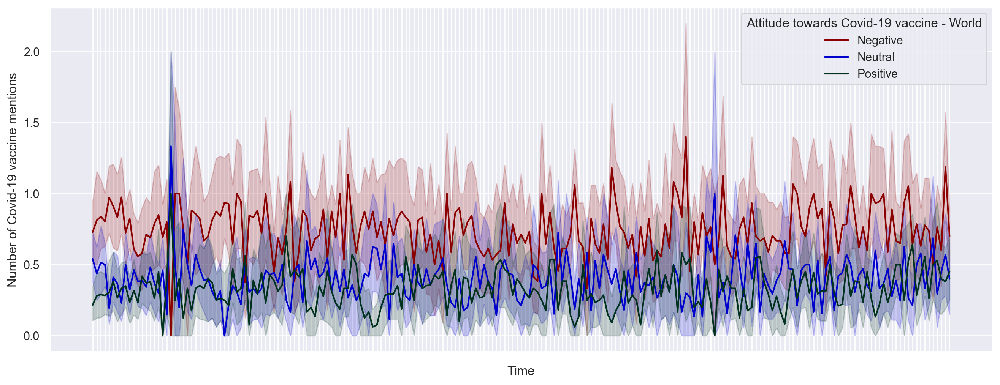

In [51]:
#Plot line chart 

mpl.rcParams['figure.dpi'] = 200
plt.figure(figsize = (16, 6))
sns.set(style = "darkgrid")

ax = sns.lineplot(x = "Time in UTC" ,y = "Number of Covid-19 vaccine mentions", hue = 'polarity', data = time_series_df3, 
                  palette = sns.color_palette(["#8b0000","#0000cd", "#013220"]))
ax.set(xlabel = 'Time', ylabel = "Number of Covid-19 vaccine mentions")
plt.legend(title = 'Attitude towards Covid-19 vaccine - World', loc = 'upper right', labels = ['Negative', 'Neutral', 'Positive'])
sns.set(rc = {"lines.linewidth": 1})
ax.set(xticklabels = [])

plt.show()

In [52]:
#Create a pie chart to show the percentage of each emotion

df_pie3 = df3.groupby('polarity').size()

mylabels = ["Negative", "Neutral", "Positive"]
mycolors = ["darkred","mediumblue", "darkgreen"]
myvalues3 = [df_pie3[-1], df_pie3[0], df_pie3[1]]

fig = go.Figure(data = [go.Pie(labels = mylabels, values = myvalues3)])
fig.update_traces(hoverinfo = 'label+percent', textinfo = 'value', textfont_size = 20, 
                  marker = dict(colors = mycolors, line = dict(color = '#000000', width = 2)),
                  title = "Polarity Pie - World3")

fig.show()

## Collecting the data only from the USA

In [53]:
#Remove all tweets not made in the USA

df3 = df3.fillna(" ")
df_usa3 = df3

i = 0

for l in df_usa3['user_location']:

    flag = 0
    
    for s in states:
        
        if s in l:
            
            flag = 1
    
    if flag == 0:

        df_usa3 = df_usa3.drop(df_usa3.index[i])
        
        i -= 1
        
    i += 1
    
df_usa3

,id_str,text,created_at,polarity,user_location,label
314908,1425496515762589697,@justhefactsMs @erjmanlasvegas @Robin_Blue19 T...,2021-08-11 16:37:08,0,"Washington, DC",true
314943,1425496550457937922,there are literally people who live in constan...,2021-08-11 16:37:16,-1,"Wisconsin, USA",true
314959,1425496571928477696,I was hesitant about vaccination. After gettin...,2021-08-11 16:37:21,1,Cave Creek AZ,true
314980,1425496591696154624,People who are saying that the covid vaccine's...,2021-08-11 16:37:26,1,"San Francisco, CA",true
315010,1425496623279452164,I asked these guys why theyre afraid of the va...,2021-08-11 16:37:34,-1,"Brooklyn, NY",true
...,...,...,...,...,...,...
364781,1425862403795955715,"@_Book_Of_Eli Look, the people have to know or...",2021-08-12 16:51:02,1,"Senatobia, MS",true
364785,1425862408216752129,Vanderbilt sees rise in sickness among unvacci...,2021-08-12 16:51:04,0,"Nashville, TN",true
364848,1425862461798830082,@tatereeves TELL PEOPLE TO GET THE VACCINE,2021-08-12 16:51:16,0,"Oxford, Mississippi",true
364857,1425862473022939147,"@asbell_tony @cachenca No, you said he flip fl...",2021-08-12 16:51:19,-1,"Edmond, OK",true


In [54]:
#Calculate the percentage of US made tweets

percent_usa3 =  len(df_usa3.index) * 100 / len(df3.index)

print("\nThe total tweets created at USA are {}% of the overall tweet collection. Specifically they are {} out of {}.".format(round(percent_usa3, 2), len(df_usa3.index), len(df3.index)))


The total tweets created at USA are 29.44% of the overall tweet collection. Specifically they are 1537 out of 5220.


In [55]:
#Clean and transform data to enable time series

time_series_df_usa3 = df_usa3.groupby([pd.Grouper(key = 'created_at', freq = '2 s'), 'polarity']).count().unstack(fill_value = 0).stack().reset_index()

time_series_df_usa3['created_at'] = pd.to_datetime(time_series_df_usa3['created_at']).apply(lambda x: x.strftime('%H:%M'))

time_series_df_usa3 = time_series_df_usa3.rename(columns = {"id_str": "Number of Covid-19 vaccine mentions", "created_at":"Time in UTC"})

time_series_usa3 = time_series_df_usa3["Time in UTC"][time_series_df_usa3['polarity'] == 0].reset_index(drop=True)

time_series_df_usa3

,Time in UTC,polarity,Number of Covid-19 vaccine mentions,text,user_location,label
0,16:37,-1,0,0,0,0
1,16:37,0,1,1,1,1
2,16:37,1,0,0,0,0
3,16:37,-1,1,1,1,1
4,16:37,0,0,0,0,0
...,...,...,...,...,...,...
4060,16:51,0,1,1,1,1
4061,16:51,1,0,0,0,0
4062,16:51,-1,2,2,2,2
4063,16:51,0,0,0,0,0


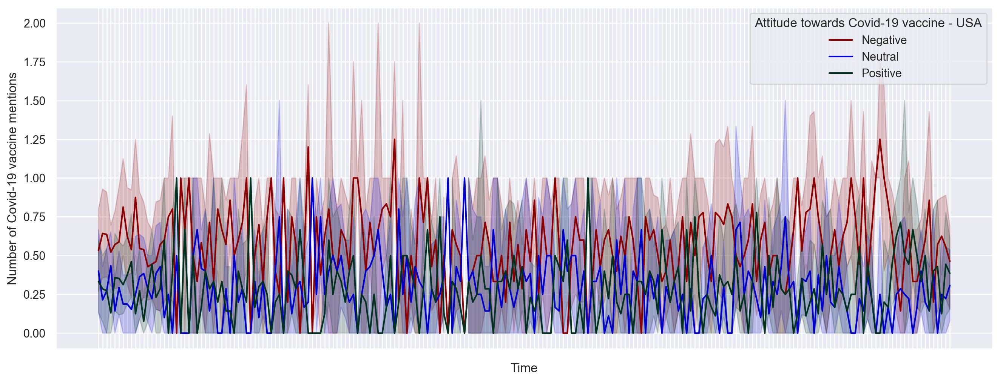

In [56]:
#Plot line chart 

mpl.rcParams['figure.dpi'] = 200
plt.figure(figsize = (16, 6))
sns.set(style = "darkgrid")

ax = sns.lineplot(x = "Time in UTC" ,y = "Number of Covid-19 vaccine mentions", hue = 'polarity', data = time_series_df_usa3,
                  palette = sns.color_palette(["#8b0000","#0000cd", "#013220"]))
ax.set(xlabel = 'Time', ylabel = "Number of Covid-19 vaccine mentions")
plt.legend(title = 'Attitude towards Covid-19 vaccine - USA', loc = 'upper right', labels = ['Negative', 'Neutral', 'Positive'])
sns.set(rc = {"lines.linewidth": 1})
ax.set(xticklabels = [])

plt.show()

In [57]:
#Create a pie chart to show the percentage of each emotion

df_pie_usa3 = df_usa3.groupby('polarity').size()

mylabels = ["Negative", "Neutral", "Positive"]
mycolors = ["darkred","mediumblue", "darkgreen"]
myvalues_usa3 = [df_pie_usa3[-1], df_pie_usa3[0], df_pie_usa3[1]]

fig = go.Figure(data = [go.Pie(labels = mylabels, values = myvalues_usa3)])
fig.update_traces(hoverinfo = 'label+percent', textinfo = 'value', textfont_size = 20, 
                  marker = dict(colors = mycolors, line = dict(color = '#000000', width = 2)),
                  title = "Polarity Pie - USA2")

fig.show()

## Adding everything together side by side

In [58]:
#Create the subplots

myspecs = [[{"type": "scatter", "rowspan": 2}, {"type": "scatter", "rowspan": 2}],
           [None, None],
           [{"type": "scatter", "rowspan": 2}, {"type": "scatter", "rowspan": 2}],
           [None, None],
           [{"type": "pie",},{"type": "pie"}],
           [{"type": "pie"},{"type": "pie"}]]

fig = make_subplots(cols = 2, rows = 6, specs = myspecs)

In [59]:
%%capture

#Time series World2

fig.add_trace(go.Scatter(x = time_series2, y = time_series_df2[f"Number of Covid-19 vaccine mentions"][time_series_df2['polarity'] == 0].reset_index(drop = True),
                         name = "Neutral", opacity = 0.8), row = 1, col = 1)   

fig.add_trace(go.Scatter(x = time_series2, y = time_series_df2[f"Number of Covid-19 vaccine mentions"][time_series_df2['polarity'] == -1].reset_index(drop = True),
                         name ="Negative", opacity = 0.8), row = 1, col = 1)

fig.add_trace(go.Scatter(x = time_series2, y = time_series_df2[f"Number of Covid-19 vaccine mentions"][time_series_df2['polarity'] == 1].reset_index(drop = True),
                         name = "Positive", opacity = 0.8), row = 1, col = 1)

In [60]:
%%capture

#Time series World3

fig.add_trace(go.Scatter(x = time_series3, y = time_series_df3[f"Number of Covid-19 vaccine mentions"][time_series_df3['polarity'] == 0].reset_index(drop = True),
                         name = "Neutral", opacity = 0.8), row = 1, col = 2)   

fig.add_trace(go.Scatter(x = time_series3, y = time_series_df3[f"Number of Covid-19 vaccine mentions"][time_series_df3['polarity'] == -1].reset_index(drop = True),
                         name ="Negative", opacity = 0.8), row = 1, col = 2)

fig.add_trace(go.Scatter(x = time_series3, y = time_series_df3[f"Number of Covid-19 vaccine mentions"][time_series_df3['polarity'] == 1].reset_index(drop = True),
                         name = "Positive", opacity = 0.8), row = 1, col = 2)

In [61]:
%%capture

#Time series USA2

fig.add_trace(go.Scatter(x = time_series_usa2, y = time_series_df_usa2[f"Number of Covid-19 vaccine mentions"][time_series_df_usa2['polarity'] == 0].reset_index(drop = True),
                         name = "Neutral", opacity = 0.8), row = 3, col = 1)   

fig.add_trace(go.Scatter(x = time_series_usa2, y = time_series_df_usa2[f"Number of Covid-19 vaccine mentions"][time_series_df_usa2['polarity'] == -1].reset_index(drop = True),
                         name ="Negative", opacity = 0.8), row = 3, col = 1)

fig.add_trace(go.Scatter(x = time_series_usa2, y = time_series_df_usa2[f"Number of Covid-19 vaccine mentions"][time_series_df_usa2['polarity'] == 1].reset_index(drop = True),
                         name = "Positive", opacity = 0.8), row = 3, col = 1)

In [62]:
%%capture

#Time series USA3

fig.add_trace(go.Scatter(x = time_series_usa3, y = time_series_df_usa3[f"Number of Covid-19 vaccine mentions"][time_series_df_usa3['polarity'] == 0].reset_index(drop = True),
                         name = "Neutral", opacity = 0.8), row = 3, col = 2)   

fig.add_trace(go.Scatter(x = time_series_usa3, y = time_series_df_usa3[f"Number of Covid-19 vaccine mentions"][time_series_df_usa3['polarity'] == -1].reset_index(drop = True),
                         name ="Negative", opacity = 0.8), row = 3, col = 2)

fig.add_trace(go.Scatter(x = time_series_usa3, y = time_series_df_usa3[f"Number of Covid-19 vaccine mentions"][time_series_df_usa3['polarity'] == 1].reset_index(drop = True),
                         name = "Positive", opacity = 0.8), row = 3, col = 2)

In [63]:
%%capture

#Pie World2

fig.add_trace(go.Pie(labels = mylabels, values = myvalues2, hovertemplate = "%{label}: <br>Value: %{value}",
                     marker = dict(colors = mycolors, line = dict(color = '#000000', width = 4)), opacity = 0.7,
                     showlegend = True, textposition = 'inside', rotation = 90), row = 5, col = 1)   

In [64]:
%%capture

#Pie World3

fig.add_trace(go.Pie(labels = mylabels, values = myvalues3, hovertemplate = "%{label}: <br>Value: %{value}",
                     marker = dict(colors = mycolors, line = dict(color = '#000000', width = 4)), opacity = 0.7,
                     showlegend = True, textposition = 'inside', rotation = 90), row = 5, col = 2)   

In [65]:
%%capture

#Pie USA2

fig.add_trace(go.Pie(labels = mylabels, values = myvalues_usa2, hovertemplate = "%{label}: <br>Value: %{value}",
                     marker = dict(colors = mycolors, line = dict(color = '#000000', width = 4)), opacity = 0.7,
                     showlegend = True, textposition = 'inside', rotation = 90), row = 6, col = 1) 

In [66]:
%%capture

#Pie USA3

fig.add_trace(go.Pie(labels = mylabels, values = myvalues_usa3, hovertemplate = "%{label}: <br>Value: %{value}",
                     marker = dict(colors = mycolors, line = dict(color = '#000000', width = 4)), opacity = 0.7,
                     showlegend = True, textposition = 'inside', rotation = 90), row = 6, col = 2) 

In [67]:
mytitle = f"Real-time tracking Covid-19 vaccine mentions collected from {len(df.index)} tweets from Twitter,<br>which {len(df_usa.index)} of those were created at USA {'('}{round(percent_usa3, 2)}{'%)'}."


fig.update_layout(title_text = mytitle,  geo = dict(scope = 'usa'), template = "plotly_dark", 
                  margin = dict(r = 20, t = 50, b = 50, l = 20),
                  annotations = [go.layout.Annotation(text = "Source: Twitter", showarrow = False, 
                                                      xref = "paper", yref = "paper", x = 0, y = 0)], 
                  showlegend = False, xaxis_rangeslider_visible = False, height = 1600, width = 980)